# Faceted Feature Visualization

This tutorial is based on the [Multimodal Neurons in Artificial Neural Networks](https://distill.pub/2021/multimodal-neurons/) research paper, and demonstrates how to visualize a model's features using the facet loss objective described in the paper.

In [ ]:
%load_ext autoreload
%autoreload 2

from typing import Callable, Dict, List, Optional, Tuple, Union

import captum.optim as opt
import torch
from captum.optim.models import clip_resnet50x4_image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

clip_model = clip_resnet50x4_image(pretrained=True).eval().to(device)

## Basic Setup

To begin, we'll define a helper function that allows us to create 1D vectors using a one-hot format for use with `VectorLoss` in order to use it as a similar objective to `ChannelActivation`. Next we define a helper function for loading pretrained linear probe weights for 7 different themes provided by the authors of the paper. We also define a helper function for rendering visualizations.

In [3]:
def one_hot(idx: Union[int, List[int]], size: int = 2560) -> torch.Tensor:
    """
    Create a 1D one hot vector of a specified size. The output of this function can
    then be used as the vector direction input to VectorLoss.

    Args:

        idx (int or list of int): One of more index locations to set equal
            to one.
        size (int): The desired size to use for the one dimensional zero
            tensor. This should be the same as the channel size for the target layer.

    Returns:
        zeros (torch.Tensor): A 1D one hot vector.
    """
    zeros = torch.zeros(size)
    zeros[idx] = 1
    return zeros.float()


def get_facet_weights(facet: str) -> List[torch.Tensor]:
    """
    Select from a list of pretrained facets of different themes / concepts. This
    function returns a list of 5 pretrained facets for the CLIP ResNet 50x4 model's
    `layer3[0].relu3`, `layer3[2].relu3`, `layer3[4].relu3`, `layer3[6].relu3`, &
    `layer3[8].relu3` layers.

    The pretrained facets were created by training linear probes to discrimate between
    a certain concept / theme, and generic natural images.

    Choices are one of:
        "face": for close ups of human faces.
        "text": for text symbols like letters and numbers.
        "logo": for organization / group symbols & designs.
        "pose": for humans in various poses.
        "arch": for architecture.
        "nature": for outdoors and nature.
        "indoor": for building interiors.

    Args:

        facet (str): The desired set of facets to use for the CLIP ResNet 50x4 model's
            lower layers. See above for the valid choices.

    Returns:
        facets (list of torch.Tensor): A list of facets for the lower layers.
    """
    facet_list = ["face", "text", "logo", "pose", "arch", "nature", "indoor"]
    assert facet in facet_list
    idx = facet_list.index(facet)
    url = "https://pytorch.s3.amazonaws.com/models/captum/clip_resnet50x4_facets.pt"
    facets_weights = torch.hub.load_state_dict_from_url(
        url, progress=True, check_hash=False
    )[idx]
    return facets_weights


def visualize(
    model: torch.nn.Module,
    image: opt.images.ImageParameterization,
    loss_fn: opt.loss.Loss,
    lr: float = 0.008,
    n_iter: int = 512,
) -> None:
    """
    Args:

        model (nn.Module): A PyTorch model instance.
        image (ImageParameterization): A Captum ImageParameterization instance.
        loss_fn (LossFunction): A Captum loss function instance.
        lr (float, optional): The learning rate to use with the Adam optimizer.
            Default: 0.008
        n_iter (int, optional): The number of iterations to perform optimization for.
            Default: 512
    """
    transforms = opt.transforms.TransformationRobustness(crop_or_pad_output=True)
    obj = opt.InputOptimization(model, loss_fn, image, transform=transforms)
    history = obj.optimize(opt.optimization.n_steps(n_iter), lr=lr)

### Faceted Feature Visualization & The FacetLoss Objective

When a neuron contains multuple distinct feature groups, the target is considered to have multiple facets. The CLIP ResNet 50x4 model that we are using and other CLIP models contain many multi-facted neurons. As multi-faceted neurons respond to multiple distinct categories of images, it can be tricky to study them without first separating out these facets. Normal feature visualization will either try to render a single facet, or will attempt to render a combination of facets blurred together. The `Diversity` objective can't be used either as it has no way to seperate out different facets from others.


Luckily though, there exists a better solution! The authors of the paper developed a new objective, known as faceted feature visualization, to help steer the feature visualization process in the direction of a particular theme or concept. In some ways, faceted feature visualization can in some ways be thought of as a more advanced version of the `Diversity` loss objective, due to it's improved ability to handle polysemantic targets.

**Faceted Feature Visualization**

Faceted feature visualization allows us to steer a loss objective towards particular themes and concepts. This is done by first training linear probes on the lower layers of a model, using a dataset composed of images relating to the target theme / concept and generic natural images. We then use the weights of the trained linear probes to steer a optimization process towards them.
 Some examples of possible facet themes are: human faces, architecture, natural scenery, or alphanumeric characters. If you wish to train your own facets, please see the Linear Probe Facet Training tutorial.

**The FacetLoss Objective**

The optim module provides the `FacetLoss` objective for performing Faceted Feature Visualization as described in the research paper [here](https://distill.pub/2021/multimodal-neurons/#faceted-feature-visualization).

The `FacetLoss` objective takes the following variables:

* `vec`: A 1D channel vector.
* `ultimate_target`: The main target layer that we are visualizing targets from. This is normally the penultimate layer of the model.
* `layer_target`: A layer that we have `facet_weights` for. This target layer should be below the `ultimate_target` layer in the model.
* `strength`: A single value or list of floats to use for batch dimension weighting.
* `facet_weights`: Weighting that steers the objective towards a particular theme or concept. These weight values should come from linear probes trained on layers in `layer_target`.
* `batch_index`: The index of the activations to optimize if optimizing a batch of activations.

For the purpose of tutorial, we provide 7 different pretrained facet themes from the authors of the paper, via the `get_facet_weights` helper function. The provided facets are:

* `"face"`: for close ups of human faces.
* `"text"`: for text symbols like letters and numbers.
* `"logo"`: for organization / group symbols & designs.
* `"pose"`: for humans in various poses.
* `"arch"`: for architecture.
* `"nature"`: for outdoors and nature.
* `"indoor"`: for building interiors.

## Rendering

### Basic Rendering

We'll start off below by rendering a basic example of the channel index: `100` for the penultimate layer of our model below.

  0%|          | 0/256 [00:00<?, ? step/s]

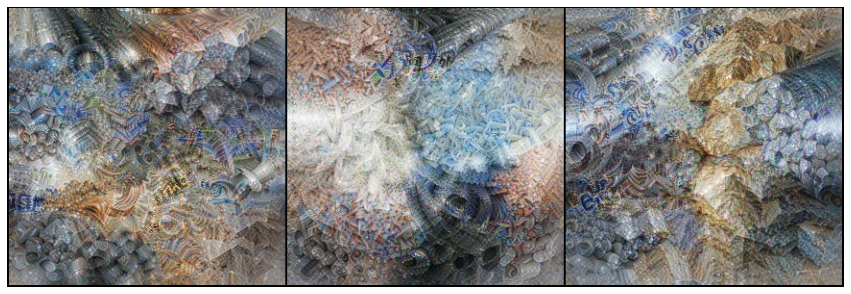

In [ ]:
# Main target layer, which the penultimate layer of the image model
ultimate_target = clip_model.layer4[5]

# Setup channel losses
channel_idx = 100
loss_fn = opt.loss.ChannelActivation(target=ultimate_target, channel_index=channel_idx)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=3).to(device)

# Optionally add L2Mean to potentially improve quality
l2_weight = 0.0
if l2_weight != 0.0:
    loss_fn = loss_fn - (l2_weight * opt.loss.L2Mean(image))

# Render the visualizations
try:
    visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)
except KeyboardInterrupt:
    pass
image().show(figsize=(15, 15), images_per_row=3)

If you look at the 3 rendering attempts for the channel above, it's not very clear what concept the channel represents. Normally this is where we would employ the `Diversity` objective to help separate out the different parts. However, as you'll see below the Diversity objective only provides a small improvement.

  0%|          | 0/256 [00:00<?, ? step/s]

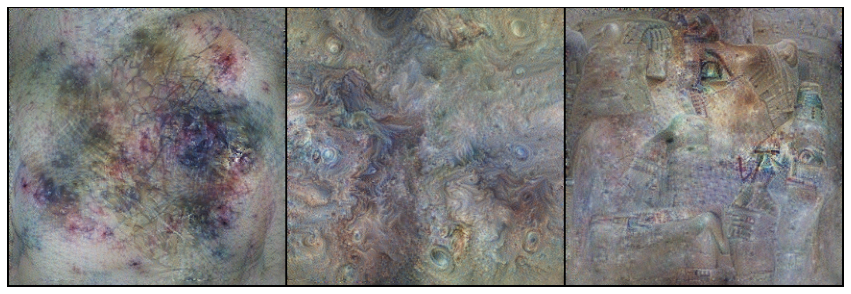

In [ ]:
# Main target layer, which the penultimate layer of the image model
ultimate_target = clip_model.layer4[5]

# Setup channel losses
channel_idx = 100
loss_fn = opt.loss.ChannelActivation(target=ultimate_target, channel_index=channel_idx)
loss_fn = loss_fn + (1e2 * opt.loss.Diversity(ultimate_target))

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=3).to(device)

# Optionally add L2Mean to potentially improve quality
l2_weight = 0.0
if l2_weight != 0.0:
    loss_fn = loss_fn - (l2_weight * opt.loss.L2Mean(image))

# Render the visualizations
try:
    visualize(clip_model, image, loss_fn, lr=0.01, n_iter=256)
except KeyboardInterrupt:
    pass
image().show(figsize=(15, 15), images_per_row=3)

To effectively study the concepts in our target, we'll have employ the new optimization strategy that we described above, known as Faceted Feature Visualization.

Note that the direction vector given to `VectorLoss` is the same one that's given to `FacetLoss`.

  0%|          | 0/256 [00:00<?, ? step/s]

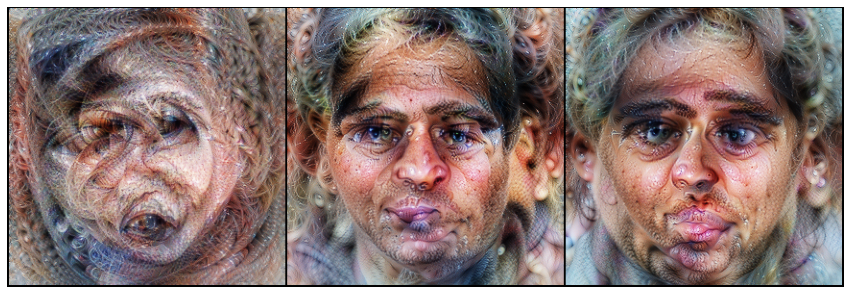

In [ ]:
facet_weights = get_facet_weights("face")
facet_weights = [x.to(device) for x in facet_weights] 

# Main target layer, which the penultimate layer of the image model
ultimate_target = clip_model.layer4[5]

# Setup one hot vector losses
channel_idx = 100
vec = one_hot(channel_idx, 2560).to(device)
loss_fn = opt.loss.VectorLoss(target=ultimate_target, vec=vec)


# Lower target layers
lower_target_layers = [
    clip_model.layer3[0].relu3,
    clip_model.layer3[2].relu3,
    clip_model.layer3[4].relu3,
    clip_model.layer3[6].relu3,
    clip_model.layer3[8].relu3,
]

# Desired strength values to use for Facet losses
strength = [0.5, 5.0]

# Setup Facet Losses for all of the lower layers
facet_loss_fn_list = [
    opt.loss.FacetLoss(
        vec=vec,
        ultimate_target=ultimate_target,
        layer_target=layer_target,
        strength=strength,
        facet_weights=f_weights,
    )
    for layer_target, f_weights in zip(lower_target_layers, facet_weights)
]
loss_fn = loss_fn + sum(facet_loss_fn_list)


# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=3).to(device)


# Optionally add L2Mean to improve quality
l2_weight = 10.0
if l2_weight != 0.0:
    loss_fn = loss_fn - (l2_weight * opt.loss.L2Mean(image))


# Render the visualizations
try:
    visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)
except KeyboardInterrupt:
    pass
image().show(figsize=(15, 15), images_per_row=3)

Now we can clearly see the information that channel index `100` contains about human faces.

In the next section, we'll show in greater detail how to separate out numerous facets from a target channel.

### Comparisons With Multiple Facets

As setting up the losses for faceted feature visualization takes a few lines of code, we can define a helper function to make it easier.

In [4]:
def setup_multi_channel_facet_objective(
    channel_vecs: Union[int, List[int], List[torch.Tensor], torch.Tensor],
    model: torch.nn.Module,
    ultimate_target: Optional[torch.nn.Module] = None,
    facet: Union[str, List[torch.Tensor]] = "face",
    device: torch.device = torch.device("cpu"),
    strength: Union[float, List[float]] = 3.3667,
    lower_target_layers: Optional[List[torch.nn.Module]] = None,
    start_at_batch: int = 0,
):
    """
    Render a set of channels or vectors with a chosen facet.

    Args:

        channel_vecs (int, list of int, list of torch.Tensor, or torch.Tensor): A list
            of layer channels or a set of channel direction vectors stacked across the
            batch dimension. If not an integer, each vec or integer will be used as a
            target for a different batch dimension. If an integer is used, then all
            batch dimensions will be used.
        model (nn.Module): A PyTorch model instance.
        facet (str or list of torch.Tensor, optional): The desired facet theme / concept
            to use for facet loss. To use the available pretrained facets trained on
            the ResNet 50x4 model, choose one of; "face", "text", "logo", "pose",
            "arch", "nature", or "indoor". For custom facets, use a list of tensors
            that correspond to the lower_target_layers.
            Default: "face"
        device (torch.device, optional): The device to use.
            Default: torch.device("cpu")
        strength (float or list of float, optional): The weighting to use for facet
            loss.
            Default: 3.3667
        ultimate_target (nn.Module, optional): The main target layer to use. Default
            is set to the penultimate layer.
            Default: model.layer4[5]
        lower_target_layers (list of nn.Module, optional): A list of lower target
            layers to use in the FacetLoss objectives.
            Default: [model.layer3[0].relu3, model.layer3[2].relu3,
            model.layer3[4].relu3, model.layer3[6].relu3, model.layer3[8].relu3]
        start_at_batch (int, optional): If channel_vecs is not an integer, this
            variable dictates at which batch index to start batch targeting.
            Default: 0

    Returns:
        loss_fn (LossFunction): A loss objective ready for use.
    """
    # Main target layer
    ultimate_target = ultimate_target or model.layer4[-1]

    if isinstance(channel_vecs, torch.Tensor):
        if channel_vecs.dim() == 1:
            channel_vecs = channel_vecs.unsqueeze(0)
        assert channel_vecs.dim() == 2
    use_batch = not isinstance(channel_vecs, int)
    channel_vecs = [channel_vecs] if isinstance(channel_vecs, int) else channel_vecs

    # Setup main target losses
    loss_fn_list, vec_list = [], []

    for b, v in enumerate(channel_vecs, start=start_at_batch):
        if isinstance(v, torch.Tensor):
            assert v.dim() == 1
            channel_vec = v.to(device)
        else:
            channel_vec = one_hot(v, 2560).to(device)
        vec_loss_fn = opt.loss.VectorLoss(
            target=ultimate_target,
            vec=channel_vec,
            batch_index=b if use_batch else None,
        )
        loss_fn_list.append(vec_loss_fn)
        vec_list.append(channel_vec)

    # Load facet weights
    if isinstance(facet, str):
        facet_weights = get_facet_weights(facet)
        facet_weights = [w.to(device) for w in facet_weights]
    else:
        assert all([isinstance(t, torch.Tensor) for t in facet])
        facet_weights = [w.to(device) for w in facet]

    # Lower target layers
    lower_target_layers = lower_target_layers or [
        model.layer3[0].relu3,
        model.layer3[2].relu3,
        model.layer3[4].relu3,
        model.layer3[6].relu3,
        model.layer3[8].relu3,
    ]

    assert len(lower_target_layers) == len(facet_weights)

    # Setup Facet Losses for all of the lower layers
    batch_facet_loss_fn_list = []
    for b, vec in enumerate(vec_list, start=start_at_batch):
        facet_loss_fn_list = [
            opt.loss.FacetLoss(
                vec=vec,
                ultimate_target=ultimate_target,
                layer_target=layer_target,
                strength=strength,
                facet_weights=f_weights,
                batch_index=b if use_batch else None,
            )
            for layer_target, f_weights in zip(lower_target_layers, facet_weights)
        ]
        batch_facet_loss_fn_list += facet_loss_fn_list
    return opt.loss.sum_loss_list(loss_fn_list + batch_facet_loss_fn_list)

Below are some examples of interesting channels in the penultimate layer, shared by the authors of the paper.

In [ ]:
# Emotions: Shocked, crying, happy, sleepy, serious, evil
# channels = [2478, 1193, 1512, 91, 2049, 1739]

# Time: Day, month, year, summer, winter
# channels = [1714, 705, 764, 2364, 1829]

# Art Style: Drawing, painting, anime, group photo
# channels = [75, 587, 122, 1388]

# Region: USA, Europe, India, West Africa, Australia, New York
# channels = [862, 218, 1067, 1257, 513, 357]

# Abstract Concepts: You, star, I / me, LGBTQ+
# channels = [371, 1344, 1883, 1820]

# Typographic: "un-", "con-", "-oo-", "-ing", "j-", "-nd-" & "-id-"
# channels = [2504, 656, 444, 2524, 399, 1084]

Rendering the same target with different facets can yield information that would have been lost without using facet loss. For example below we'll compare the Canada channel (idx: `2408`) and the USA channel (idx: `862`).

Note that the model’s dataset was collected in 2019, and thus our visualizations will likely emphasizes information from around that time.

In [5]:
# Canada, USA
channels = [2408, 862]

#### No Facet

As you can see below, the channels for both countries are highly polysemanticity.

  0%|          | 0/256 [00:00<?, ? step/s]

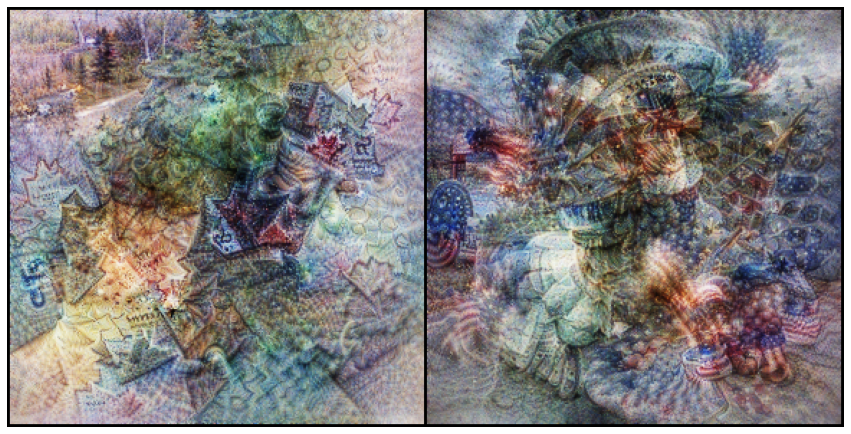

In [ ]:
loss_fn = opt.loss.VectorLoss(
    target=clip_model.layer4[5],
    vec=one_hot(channels[0], 2560).to(device),
    batch_index=0,
)
loss_fn = loss_fn + opt.loss.VectorLoss(
    target=clip_model.layer4[5],
    vec=one_hot(channels[1], 2560).to(device),
    batch_index=1,
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

#### Facet: Logo

Below we can see the channel for Canada on the left, and United States on the right, with the `logo` facet. We can clearly see symbols that we commonly associated with both countries in the rendered results.

  0%|          | 0/256 [00:00<?, ? step/s]

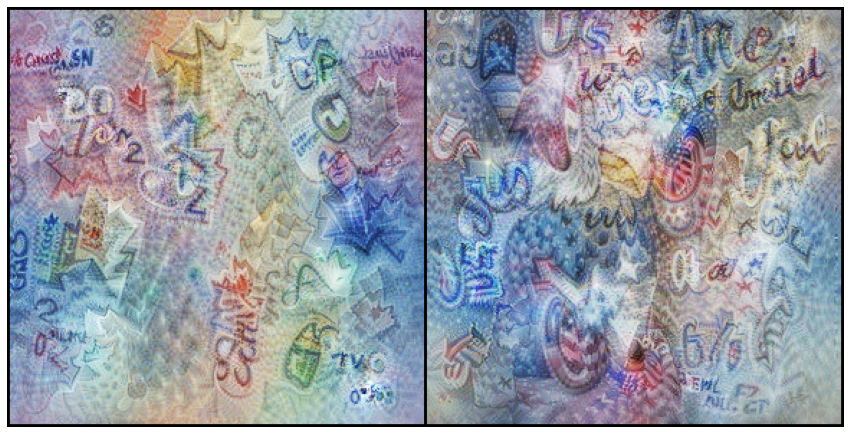

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="logo", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

  0%|          | 0/256 [00:00<?, ? step/s]

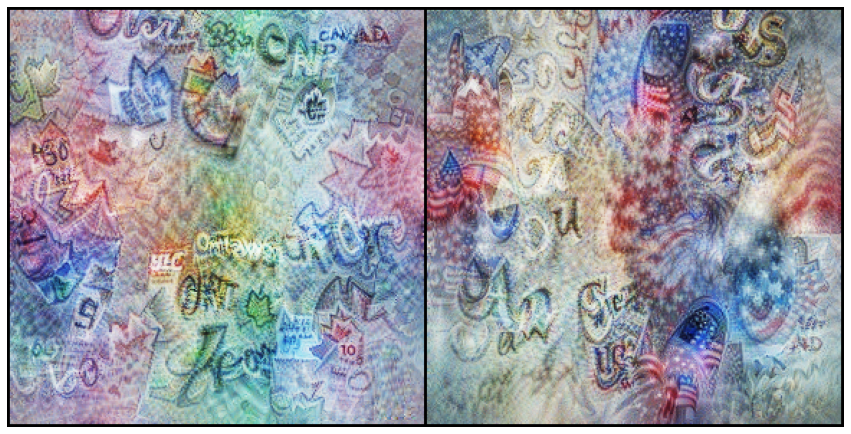

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="logo", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

#### Facet: Text

For the `text` facet, we can make out words that we'd associate with each country. Some examples that you might notice in the renderings below include city names, state / province names, country names, and other words that are commonly associated with each country.

  0%|          | 0/256 [00:00<?, ? step/s]

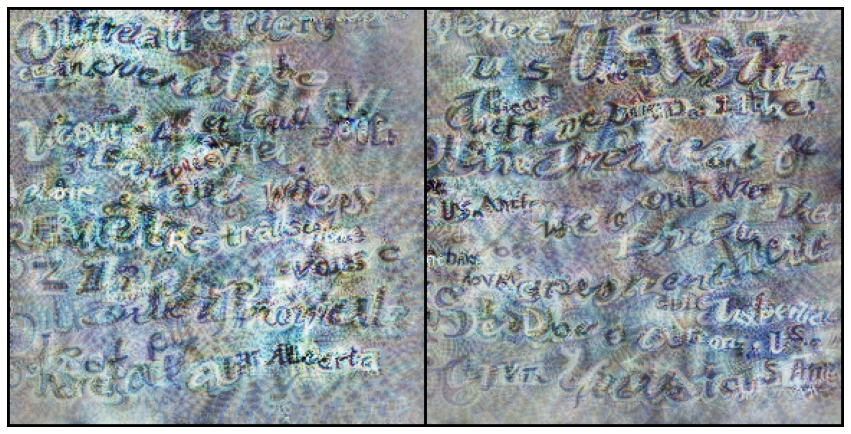

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="text", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

  0%|          | 0/256 [00:00<?, ? step/s]

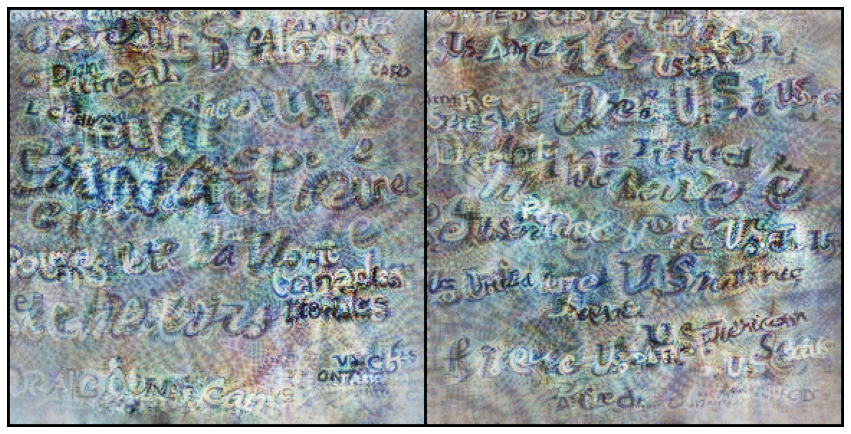

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="text", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

#### Facet: Architecture

For the `arch` facet, we can for example see that the model views large trees as being associated with Canadian architecture while architecture from the US features the country's flag.

  0%|          | 0/256 [00:00<?, ? step/s]

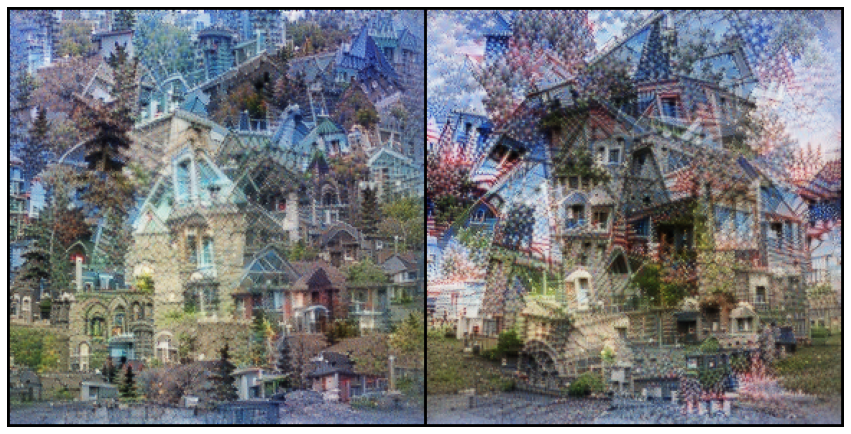

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="arch", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

#### Facet: Face

For the `face` facet, we can see amalgamations of individuals that the model associates with each country from around 2019.

  0%|          | 0/256 [00:00<?, ? step/s]

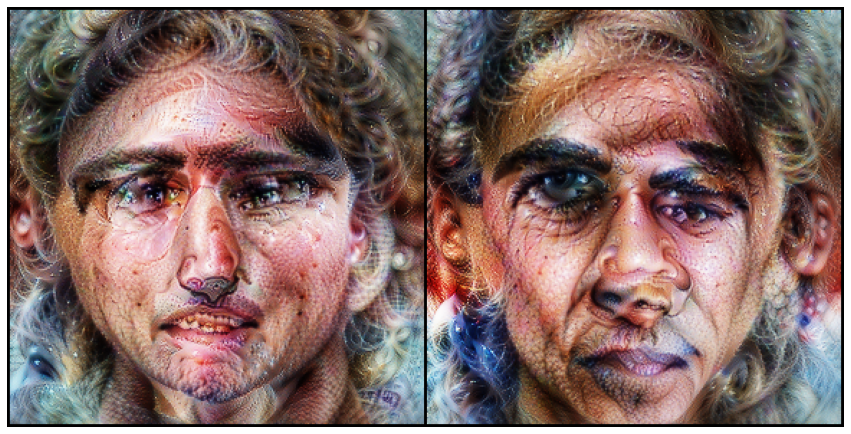

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="face", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

#### Facet: pose

For the `pose` facet we can see what looks like US military uniforms on the USA channel.

  0%|          | 0/256 [00:00<?, ? step/s]

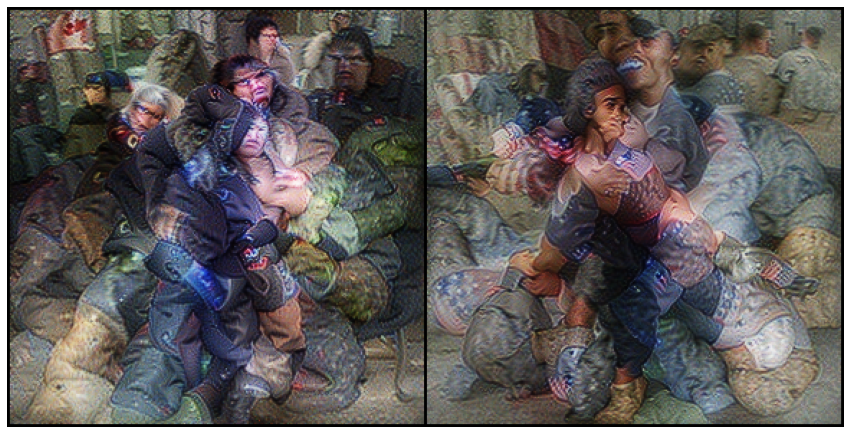

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="pose", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

#### Facet: nature

  0%|          | 0/256 [00:00<?, ? step/s]

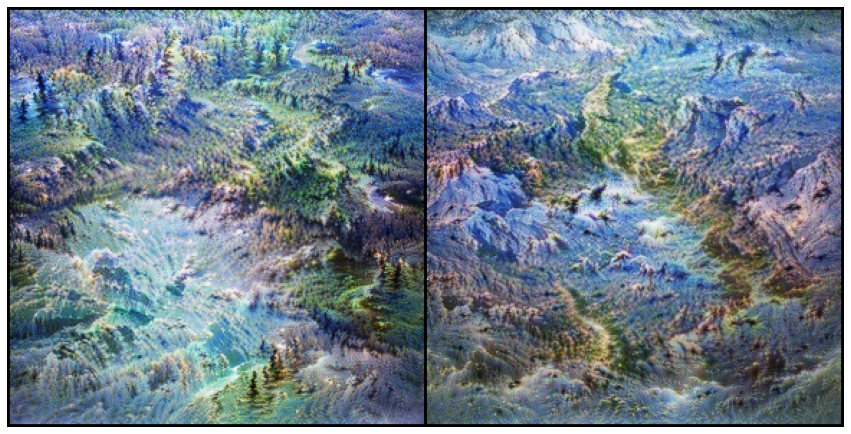

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="nature", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)

#### Facet: indoor

For the `indoor` facet, the main distinction between the Canadian and American channels seems to be inclusion of American flags in the American channel.

  0%|          | 0/256 [00:00<?, ? step/s]

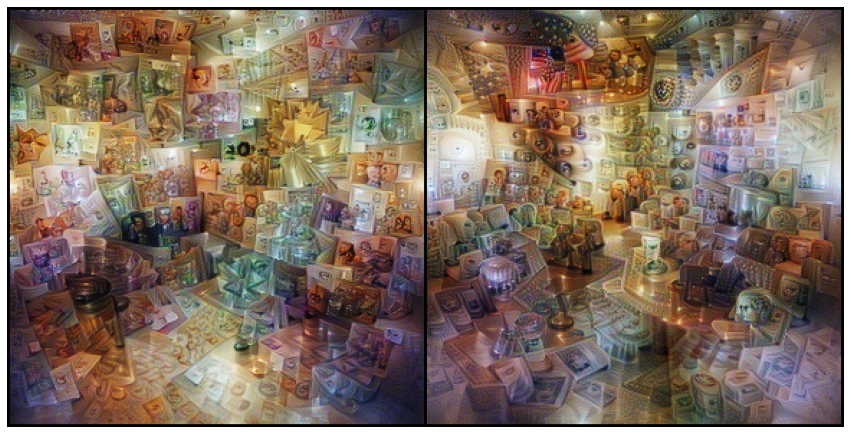

In [ ]:
loss_fn = setup_multi_channel_facet_objective(
    channels, model=clip_model, facet="indoor", device=device
)

# Setup image parameterization
image = opt.images.NaturalImage((288, 288), batch=len(channels)).to(device)

loss_fn = loss_fn - (10.0 * opt.loss.L2Mean(image))

visualize(clip_model, image, loss_fn, lr=0.008, n_iter=256)

# Canada: left, USA: right
opt.images.show(image(), figsize=(15, 15), images_per_row=2)